# Spatial & Geospatial Analysis of Flood Events

### Import Modules

In [24]:
import pandas as pd
import numpy as np

### Load Data

In [25]:
input_data_directory = '../../../../../data/meteorologia/clean'

ocorrencias = pd.read_csv(f'{input_data_directory}/adm_cor_comando/ocorrencias.csv')
pops = pd.read_csv('../../../data/raw/adm_cor_comando/pops.csv', index_col=0)

### Preprocessing `ocorrencias`

In [26]:
# Convert datetime data type fields
ocorrencias['data_inicio'] = pd.to_datetime(ocorrencias['data_inicio'])
ocorrencias['data_fim'] = pd.to_datetime(ocorrencias['data_fim'])

# Map event type
ocorrencias['tipo'] = ocorrencias['id_pop'].map(pops.set_index('id')['titulo'])

### Filter flood events

In [27]:
flood_types = [
    "Bolsão d'água em via",
    'Alagamento',
    'Alagamentos e enchentes',
    'Enchente',
    "Lâmina d'água"
]

ocorrencias = ocorrencias[ocorrencias['tipo'].isin(flood_types)]
ocorrencias['tipo'] = ocorrencias['tipo'].replace('Alagamentos e enchentes', 'Alagamento').replace('Enchente', 'Alagamento')

---

## Data Visualization of Flood Events

# Data Visualization of Flood Events in Rio de Janeiro

This Jupyter Notebook implements a comprehensive data visualization plan to analyze flood events in Rio de Janeiro, using the dataset loaded into the `ocorrencias` variable. We will use Plotly for creating interactive and informative visualizations.

## 1. Data Overview & Preprocessing

In this section, we will load the necessary libraries, inspect the dataset, and perform data cleaning and feature engineering steps as outlined in the plan.

In [28]:
# !pip install wordcloud
# !pip install nltk
# !pip install cartopy
# !pip install geopandas
# !pip install rasterio
# !pip install contextily

import pandas as pd
# import plotly.express as px
# import plotly.graph_objects as go
# from plotly.subplots import make_subplots
import numpy as np
from collections import Counter
from wordcloud import WordCloud
import matplotlib.pyplot as plt

# print("First 5 rows of the DataFrame:")
# print(ocorrencias.head())
# print("\nDataFrame Info:")
# print(ocorrencias.info())

### Data Cleaning & Transformation

- Convert “data_inicio” and “data_fim” to datetime objects.
- Compute event duration (in minutes) as a new column.
- Derive additional temporal features (hour, day of week, month, season).
- Handle missing values in `prazo_num` (filling with 0 for now as example).

In [29]:
ocorrencias['duration_seconds'] = (ocorrencias['data_fim'] - ocorrencias['data_inicio']).dt.total_seconds()
ocorrencias['duration_minutes'] = ocorrencias['duration_seconds'] / 60

ocorrencias['hour_start'] = ocorrencias['data_inicio'].dt.hour
ocorrencias['day_of_week'] = ocorrencias['data_inicio'].dt.day_name()
ocorrencias['month'] = ocorrencias['data_inicio'].dt.month_name()
ocorrencias['month_num'] = ocorrencias['data_inicio'].dt.month
ocorrencias['year'] = ocorrencias['data_inicio'].dt.year
ocorrencias['day_of_month'] = ocorrencias['data_inicio'].dt.day
ocorrencias['date'] = pd.to_datetime(ocorrencias['data_inicio'].dt.date)

# Define seasons (for Rio de Janeiro - approximate)
def get_season(month):
    if month in [12, 1, 2]:
        return 'Summer'
    elif month in [3, 4, 5]:
        return 'Autumn'
    elif month in [6, 7, 8]:
        return 'Winter'
    else:
        return 'Spring'

ocorrencias['season'] = ocorrencias['month_num'].apply(get_season)

# Handle missing values in 'prazo_num' - Fill with 0 for demonstration
ocorrencias['prazo_num'] = ocorrencias['prazo_num'].fillna(0)

print("\nDataFrame after preprocessing:")
display(ocorrencias.head())


DataFrame after preprocessing:


,id_pop,id_evento,bairro,data_inicio,data_fim,prazo,descricao,gravidade,latitude,longitude,...,duration_seconds,duration_minutes,hour_start,day_of_week,month,month_num,year,day_of_month,date,season
829,5.0,66955,Caju,2021-10-15 22:11:46+00:00,2021-10-15 22:16:00+00:00,Curto,"Av. rio de janeiro, 675 - caju",Baixo,-22.891448,-43.214630,...,254.0,4.233333,22,Friday,October,10,2021,15,2021-10-15,Spring
830,5.0,67278,Lagoa,2021-10-24 16:34:17+00:00,2021-10-24 19:52:44+00:00,Curto,"Av. epitácio pessoa, alt. r. garcia d'avila- l...",Baixo,-22.980942,-43.208720,...,11907.0,198.450000,16,Sunday,October,10,2021,24,2021-10-24,Spring
831,5.0,67280,Lagoa,2021-10-24 16:45:02+00:00,2021-10-24 18:19:05+00:00,Curto,"Av. borges de medeiros, alt. r. batista da cos...",Baixo,-22.965323,-43.215881,...,5643.0,94.050000,16,Sunday,October,10,2021,24,2021-10-24,Spring
832,5.0,67279,Lagoa,2021-10-24 16:39:46+00:00,2021-10-24 17:50:16+00:00,Curto,"Viaduto saint hilaire, alt. alça de acesso av....",Baixo,-22.961056,-43.204173,...,4230.0,70.500000,16,Sunday,October,10,2021,24,2021-10-24,Spring
833,5.0,66613,Penha,2021-10-03 17:29:02+00:00,2021-10-03 18:15:23+00:00,Curto,Rua ibiapina - alt. r. monsenhor alves rocha -...,Baixo,-22.841611,-43.276258,...,2781.0,46.350000,17,Sunday,October,10,2021,3,2021-10-03,Spring


### Data Segmentation

- Create subsets for each event type.

In [30]:
bolsao_dagua = ocorrencias[ocorrencias['tipo'] == "Bolsão d'água em via"]
alagamentos = ocorrencias[ocorrencias['tipo'] == "Alagamento"]
lamina_dagua = ocorrencias[ocorrencias['tipo'] == "Lâmina d'água"]

print("\nNumber of 'Bolsão d'água em via' events:", len(bolsao_dagua))
print("Number of 'Alagamento' events:", len(alagamentos))
print("Number of 'Lâmina d'água' events:", len(lamina_dagua))


Number of 'Bolsão d'água em via' events: 4217
Number of 'Alagamento' events: 466
Number of 'Lâmina d'água' events: 185


---

## 2. Spatial & Geospatial Visualizations

### Scatter Maps

- Plot events on a map of Rio de Janeiro using latitude and longitude.
- Use color coding or different markers for each event type.

C:\Users\Hanna\AppData\Local\Temp\ipykernel_16032\1688790787.py:43: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap = cm.get_cmap('viridis', len(unique_types))


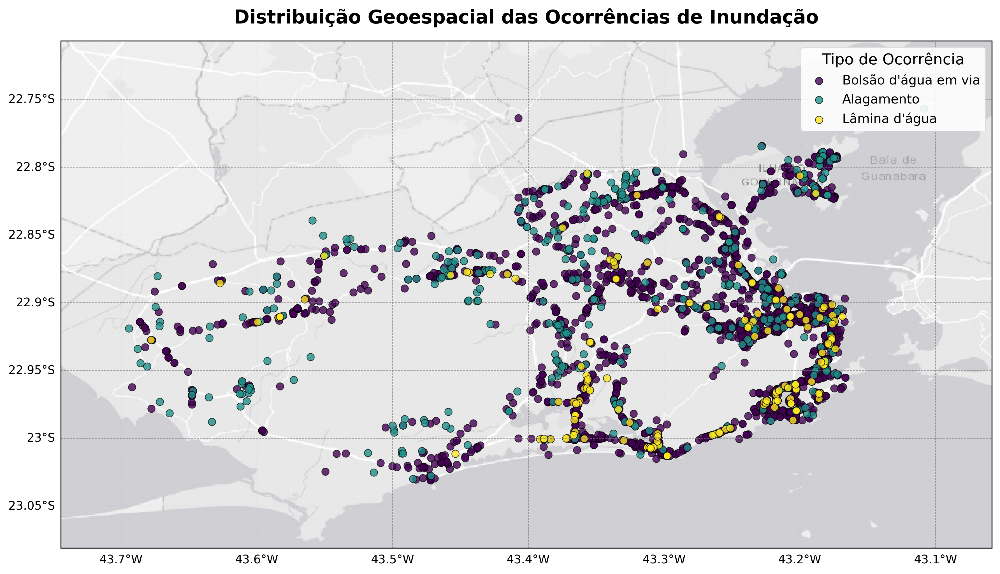

In [31]:
import matplotlib.pyplot as plt
import cartopy.io.img_tiles as cimgt
import cartopy.crs as ccrs
import matplotlib.cm as cm
import geopandas as gpd # Usado para os limites

# Estilo para publicações acadêmicas e alta resolução
plt.style.use('seaborn-v0_8-paper')
plt.rcParams['figure.dpi'] = 300

# Classe para tiles customizados (mantida como no original)
class CustomTiles(cimgt.OSM):
    def __init__(self, url, attribution=None):
        super().__init__()
        self._url_template = url
        self.attribution = attribution or "Atribuição de dados não definida"
    def _image_url(self, tile):
        x, y, z = tile
        return self._url_template.format(z=z, x=x, y=y, s='a')

# Calcula a extensão do mapa dinamicamente com uma pequena margem
lon_min, lon_max = ocorrencias['longitude'].min() - 0.05, ocorrencias['longitude'].max() + 0.05
lat_min, lat_max = ocorrencias['latitude'].min() - 0.05, ocorrencias['latitude'].max() + 0.05

# Configura a figura
fig, ax = plt.subplots(figsize=(12, 12), subplot_kw={'projection': ccrs.PlateCarree()})
ax.set_extent([lon_min, lon_max, lat_min, lat_max], crs=ccrs.PlateCarree())

# Adiciona o mapa base (basemap)
tile_url = "https://server.arcgisonline.com/arcgis/rest/services/Canvas/World_Light_Gray_Base/MapServer/tile/{z}/{y}/{x}"
tiler = CustomTiles(tile_url)
ax.add_image(tiler, 11) # Zoom nível 11 para mais detalhes

# Adiciona as linhas de grade com rótulos
gl = ax.gridlines(crs=ccrs.PlateCarree(), draw_labels=True, linewidth=0.5, color='gray', alpha=0.7, linestyle='--')
gl.top_labels = False
gl.right_labels = False
gl.xlabel_style = {'size': 10, 'color': 'black'}
gl.ylabel_style = {'size': 10, 'color': 'black'}

# Agrupa os dados por 'tipo' e define cores únicas
unique_types = ocorrencias['tipo'].unique()
cmap = cm.get_cmap('viridis', len(unique_types))
colors = {etype: cmap(i) for i, etype in enumerate(unique_types)}

# Plota cada tipo de evento com marcadores aprimorados
for etype in unique_types:
    subset = ocorrencias[ocorrencias['tipo'] == etype]
    ax.scatter(subset['longitude'], subset['latitude'],
               label=etype,
               color=colors[etype],
               s=40,
               edgecolor='black', # Borda preta para contraste
               linewidth=0.5,
               alpha=0.8,
               transform=ccrs.PlateCarree())

# Configura a legenda
legend = ax.legend(title='Tipo de Ocorrência', loc='upper right', frameon=True, fontsize=11, title_fontsize=13)
legend.get_frame().set_facecolor('white')
legend.get_frame().set_alpha(0.9)

ax.set_title('Distribuição Geoespacial das Ocorrências de Inundação', fontsize=16, weight='bold', pad=15)
plt.tight_layout()
plt.show()

### Density Heatmaps (Kernel Density Estimation Maps)

- Create heatmaps showing concentration areas (hotspots) of events across the city.

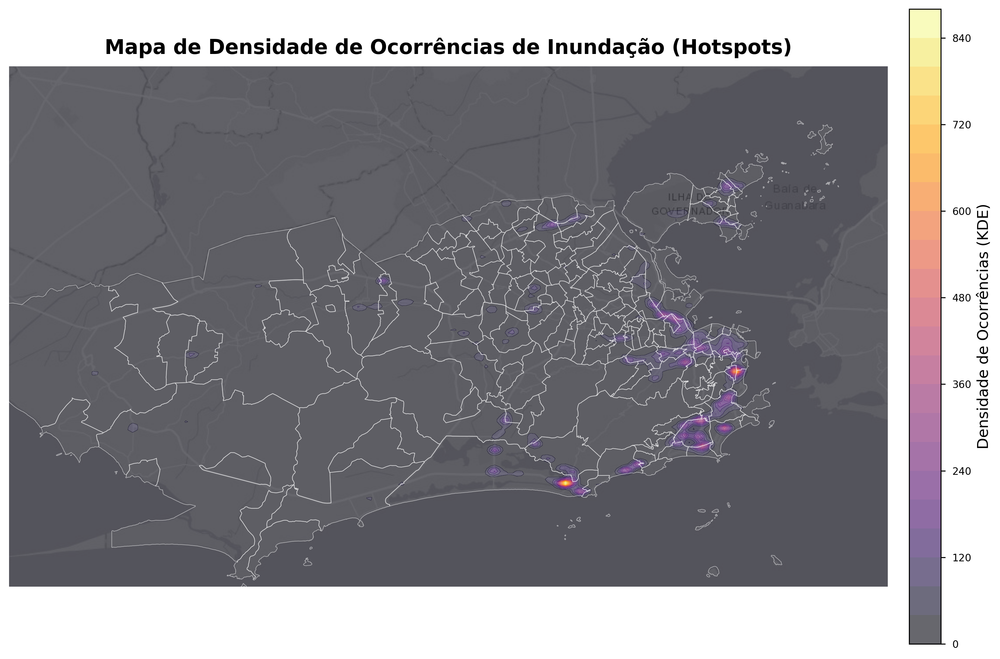

In [32]:
import matplotlib.pyplot as plt
import cartopy.io.img_tiles as cimgt
import cartopy.crs as ccrs
import numpy as np
from scipy.stats import gaussian_kde
import geopandas as gpd

# Estilo para publicações e alta resolução
plt.style.use('seaborn-v0_8-paper')
plt.rcParams['figure.dpi'] = 300

# Classe para tiles customizados
class CustomTiles(cimgt.OSM):
    def __init__(self, url, attribution=None):
        super().__init__()
        self._url_template = url
        self.attribution = attribution or "Atribuição de dados não definida"
    def _image_url(self, tile):
        x, y, z = tile
        return self._url_template.format(z=z, x=x, y=y, s='a')

# Prepara os dados
subset = ocorrencias.dropna(subset=['latitude', 'longitude'])
x, y = subset['longitude'].values, subset['latitude'].values

# Cálculo do KDE
xy = np.vstack([x, y])
kde = gaussian_kde(xy, bw_method=0.03) # Ajuste do bw_method pode ser necessário

xmin, xmax = x.min() - 0.05, x.max() + 0.05
ymin, ymax = y.min() - 0.05, y.max() + 0.05
xx, yy = np.mgrid[xmin:xmax:200j, ymin:ymax:200j] # Resolução menor para performance
positions = np.vstack([xx.ravel(), yy.ravel()])
density = np.reshape(kde(positions).T, xx.shape)

# Mapa base
tiler = CustomTiles("https://server.arcgisonline.com/arcgis/rest/services/Canvas/World_Light_Gray_Base/MapServer/tile/{z}/{y}/{x}")
crs = tiler.crs

# Configuração do plot
fig, ax = plt.subplots(figsize=(12, 12), subplot_kw={'projection': crs})
ax.set_extent([xmin, xmax, ymin, ymax])
ax.add_image(tiler, 11)

# Mapa de calor (densidade)
density_map = ax.contourf(xx, yy, density, levels=25, cmap='inferno', alpha=0.6, transform=ccrs.PlateCarree())

# Contorno dos bairros (opcional, mas bom para referência)
neighborhoods_path = f"{input_data_directory}/dados_mestres/bairro.shp"
neighborhoods_gdf = gpd.read_file(neighborhoods_path).to_crs(crs)
ax.add_geometries(neighborhoods_gdf.geometry, crs=crs, facecolor='none', edgecolor='white', linewidth=0.5, alpha=0.5)

# Barra de cores
cbar = fig.colorbar(density_map, ax=ax, orientation='vertical', pad=0.02, shrink=0.6)
cbar.set_label('Densidade de Ocorrências (KDE)', fontsize=12)

# Estilização final
ax.set_title('Mapa de Densidade de Ocorrências de Inundação (Hotspots)', fontsize=16, weight='bold', pad=10)
ax.set_axis_off()

plt.tight_layout()
plt.show()

### Choropleth Maps

- A map coloring neighborhoods based on event frequency.
- **Note:** Choropleth maps require geospatial boundaries. This involves merging with an external GeoJSON or shapefile. Skipping for now but mentioning the possibility.

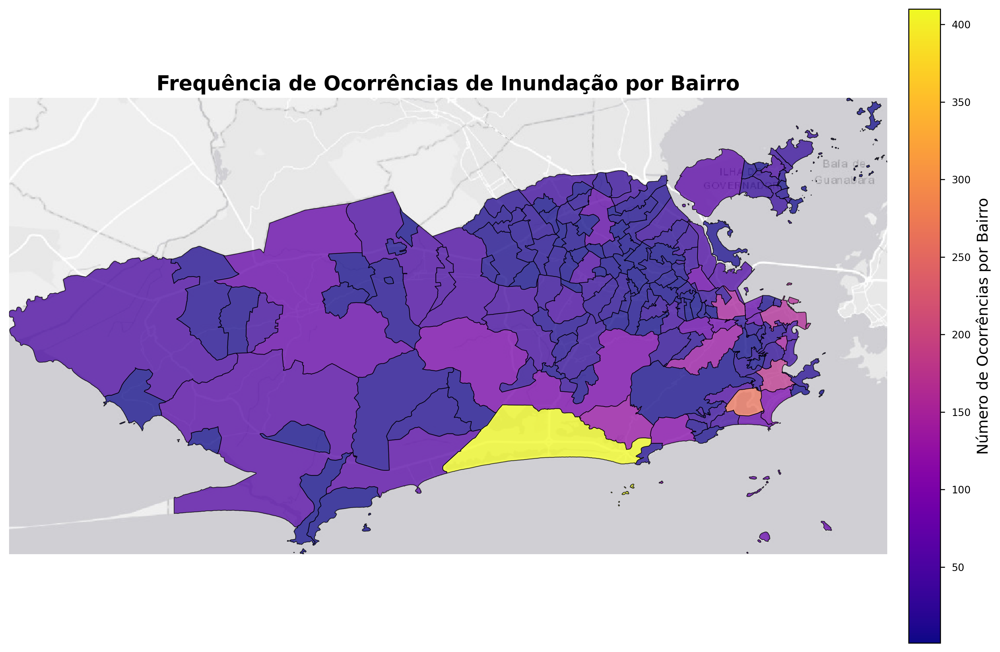

In [33]:
import geopandas as gpd
import matplotlib.pyplot as plt
from matplotlib.colors import Normalize
import cartopy.crs as ccrs
import cartopy.io.img_tiles as cimgt

# Estilo e resolução
plt.style.use('seaborn-v0_8-paper')
plt.rcParams['figure.dpi'] = 300

# Classe de tiles
class CustomTiles(cimgt.OSM):
    def __init__(self, url, attribution=None):
        super().__init__()
        self._url_template = url
        self.attribution = attribution or "Atribuição de dados não definida"
    def _image_url(self, tile):
        x, y, z = tile
        return self._url_template.format(z=z, x=x, y=y, s='a')

# Projeção para o mapa base
map_proj = ccrs.Mercator()

# --- Carregar e Processar Dados ---
# Carregar ocorrências para GeoDataFrame
gdf_events = gpd.GeoDataFrame(
    ocorrencias,
    geometry=gpd.points_from_xy(ocorrencias.longitude, ocorrencias.latitude),
    crs="EPSG:4326"
).to_crs(map_proj.proj4_init)

# Carregar bairros
neighborhoods_path = f"{input_data_directory}/dados_mestres/bairro.shp"
neighborhoods_gdf = gpd.read_file(neighborhoods_path).to_crs(map_proj.proj4_init)

# Contar ocorrências por bairro
joined = gpd.sjoin(neighborhoods_gdf, gdf_events, how="left", predicate="contains")
event_counts = joined.index.value_counts()
neighborhoods_gdf['event_count'] = neighborhoods_gdf.index.map(event_counts).fillna(0)

# --- Plotagem ---
fig, ax = plt.subplots(figsize=(12, 12), subplot_kw={"projection": map_proj})

# Adicionar mapa base
tiler = CustomTiles("https://server.arcgisonline.com/arcgis/rest/services/Canvas/World_Light_Gray_Base/MapServer/tile/{z}/{y}/{x}")
ax.add_image(tiler, 11)
ax.set_extent(neighborhoods_gdf.total_bounds[[0, 2, 1, 3]], crs=map_proj)

# Plotar o coroplético
neighborhoods_gdf.plot(
    ax=ax,
    column="event_count",
    cmap="plasma",
    linewidth=0.6,
    edgecolor="black",
    alpha=0.75
)

# Adicionar barra de cores
norm = Normalize(vmin=neighborhoods_gdf["event_count"].min(), vmax=neighborhoods_gdf["event_count"].max())
sm = plt.cm.ScalarMappable(cmap="plasma", norm=norm)
sm._A = [] # workaround para o mappable
cbar = fig.colorbar(sm, ax=ax, orientation="vertical", shrink=0.6, pad=0.02)
cbar.set_label("Número de Ocorrências por Bairro", fontsize=12)

# Finalização
ax.set_title("Frequência de Ocorrências de Inundação por Bairro", fontsize=16, weight='bold')
ax.set_axis_off()
plt.tight_layout()
plt.show()

### Cloropeth Map with fixed intervals

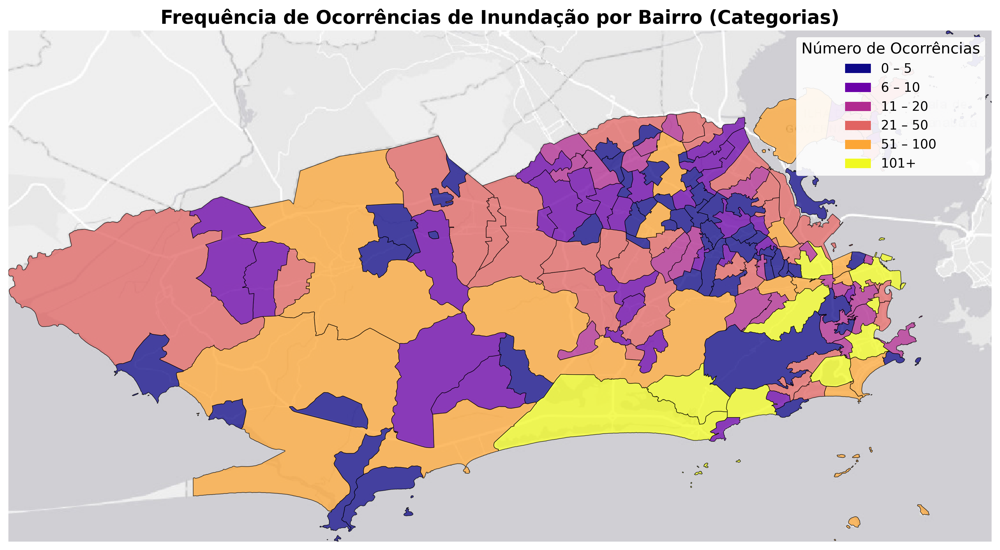

In [34]:
import geopandas as gpd
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
import cartopy.crs as ccrs
import cartopy.io.img_tiles as cimgt

# Estilo e resolução
plt.style.use('seaborn-v0_8-paper')
plt.rcParams['figure.dpi'] = 300

# Classe de tiles
class CustomTiles(cimgt.OSM):
    def __init__(self, url, attribution=None):
        super().__init__()
        self._url_template = url
        self.attribution = attribution or "Atribuição de dados não definida"
    def _image_url(self, tile):
        x, y, z = tile
        return self._url_template.format(z=z, x=x, y=y, s='a')

map_proj = ccrs.Mercator()

# --- Carregar e processar dados (código similar ao anterior) ---
gdf_events = gpd.GeoDataFrame(ocorrencias, geometry=gpd.points_from_xy(ocorrencias.longitude, ocorrencias.latitude), crs="EPSG:4326").to_crs(map_proj.proj4_init)
neighborhoods_path = f"{input_data_directory}/dados_mestres/bairro.shp"
neighborhoods_gdf = gpd.read_file(neighborhoods_path).to_crs(map_proj.proj4_init)
joined = gpd.sjoin(neighborhoods_gdf, gdf_events, how="left", predicate="contains")
event_counts = joined.index.value_counts()
neighborhoods_gdf['event_count'] = neighborhoods_gdf.index.map(event_counts).fillna(0)

# --- Agrupar contagens em categorias (bins) ---
bins = [-1, 5, 10, 20, 50, 100, np.inf]
labels = ["0 – 5", "6 – 10", "11 – 20", "21 – 50", "51 – 100", "101+"]
neighborhoods_gdf["count_bin"] = pd.cut(neighborhoods_gdf["event_count"], bins=bins, labels=labels)

# --- Paleta de cores ---
colors = plt.cm.plasma(np.linspace(0, 1, len(labels)))
color_map = dict(zip(labels, colors))

# --- Plotagem ---
fig, ax = plt.subplots(figsize=(12, 12), subplot_kw={"projection": map_proj})
tiler = CustomTiles("https://server.arcgisonline.com/arcgis/rest/services/Canvas/World_Light_Gray_Base/MapServer/tile/{z}/{y}/{x}")
ax.add_image(tiler, 11)
ax.set_extent(neighborhoods_gdf.total_bounds[[0, 2, 1, 3]], crs=map_proj)

# Plotar cada categoria para construir o mapa
for label in labels:
    subset = neighborhoods_gdf[neighborhoods_gdf["count_bin"] == label]
    if not subset.empty:
        subset.plot(ax=ax, color=color_map[label], edgecolor='black', linewidth=0.5, alpha=0.75)

# --- Legenda customizada ---
legend_patches = [mpatches.Patch(color=color_map[label], label=label) for label in labels]
ax.legend(handles=legend_patches, title="Número de Ocorrências", loc='upper right',
          fontsize=11, title_fontsize=13, frameon=True, facecolor='white', framealpha=0.9)

# --- Título e finalização ---
ax.set_title("Frequência de Ocorrências de Inundação por Bairro (Categorias)", fontsize=16, weight='bold')
ax.set_axis_off()
plt.tight_layout()
plt.show()

### Event Type Comparison Maps

- Small multiples (or faceted maps) for each event type to visually compare their spatial distributions.

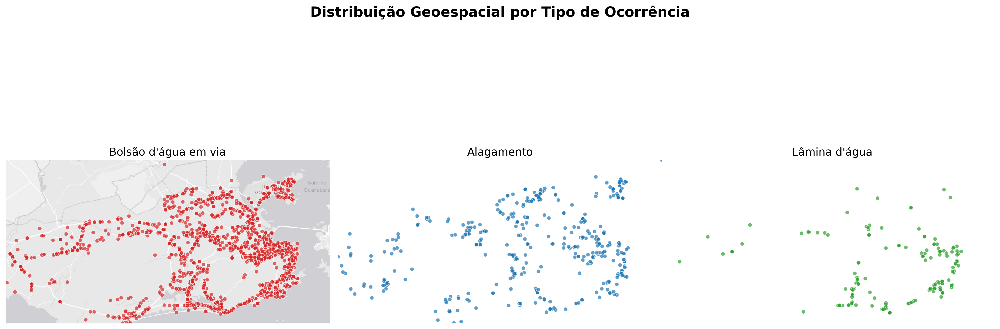

In [35]:
import geopandas as gpd
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
import cartopy.io.img_tiles as cimgt

# Estilo e resolução
plt.style.use('seaborn-v0_8-paper')
plt.rcParams['figure.dpi'] = 300

# Classe de tiles
class CustomTiles(cimgt.OSM):
    def __init__(self, url, attribution=None):
        super().__init__()
        self._url_template = url
        self.attribution = attribution or "Atribuição de dados não definida"
    def _image_url(self, tile):
        x, y, z = tile
        return self._url_template.format(z=z, x=x, y=y, s='a')

# Preparar dados
gdf_events = gpd.GeoDataFrame(ocorrencias, geometry=gpd.points_from_xy(ocorrencias.longitude, ocorrencias.latitude), crs="EPSG:4326").to_crs(map_proj.proj4_init)
unique_types = gdf_events['tipo'].unique()
colors = ['#d62728', '#1f77b4', '#2ca02c'] # Vermelho, Azul, Verde

# --- Plotagem com Facetas (small multiples) ---
# Criar uma figura com 3 subplots (1 linha, 3 colunas)
fig, axes = plt.subplots(1, 3, figsize=(18, 8), subplot_kw={'projection': map_proj})
fig.suptitle('Distribuição Geoespacial por Tipo de Ocorrência', fontsize=18, weight='bold')

tiler = CustomTiles("https://server.arcgisonline.com/arcgis/rest/services/Canvas/World_Light_Gray_Base/MapServer/tile/{z}/{y}/{x}")
map_extent = gdf_events.total_bounds[[0, 2, 1, 3]]

# Iterar sobre cada tipo de evento e seu respectivo eixo
for i, (tipo, ax) in enumerate(zip(unique_types, axes.flatten())):
    map_extent = gdf_events.total_bounds[[0, 2, 1, 3]]
    map_proj = ccrs.Mercator()
    tiler = CustomTiles("https://server.arcgisonline.com/arcgis/rest/services/Canvas/World_Light_Gray_Base/MapServer/tile/{z}/{y}/{x}")
    
    ax.set_extent(map_extent, crs=map_proj)
    ax.add_image(tiler, 11)
    
    subset = gdf_events[gdf_events['tipo'] == tipo]
    
    subset.plot(ax=ax,
                markersize=25,
                color=colors[i],
                alpha=0.7,
                edgecolor='white',
                linewidth=0.5)

    ax.set_title(tipo, fontsize=14)
    ax.set_axis_off()

plt.tight_layout(rect=[0, 0, 1, 0.95]) # Ajuste para o título principal
plt.show()

### Animated Maps

- Develop a time-lapse map to show the evolution of flood events over time.

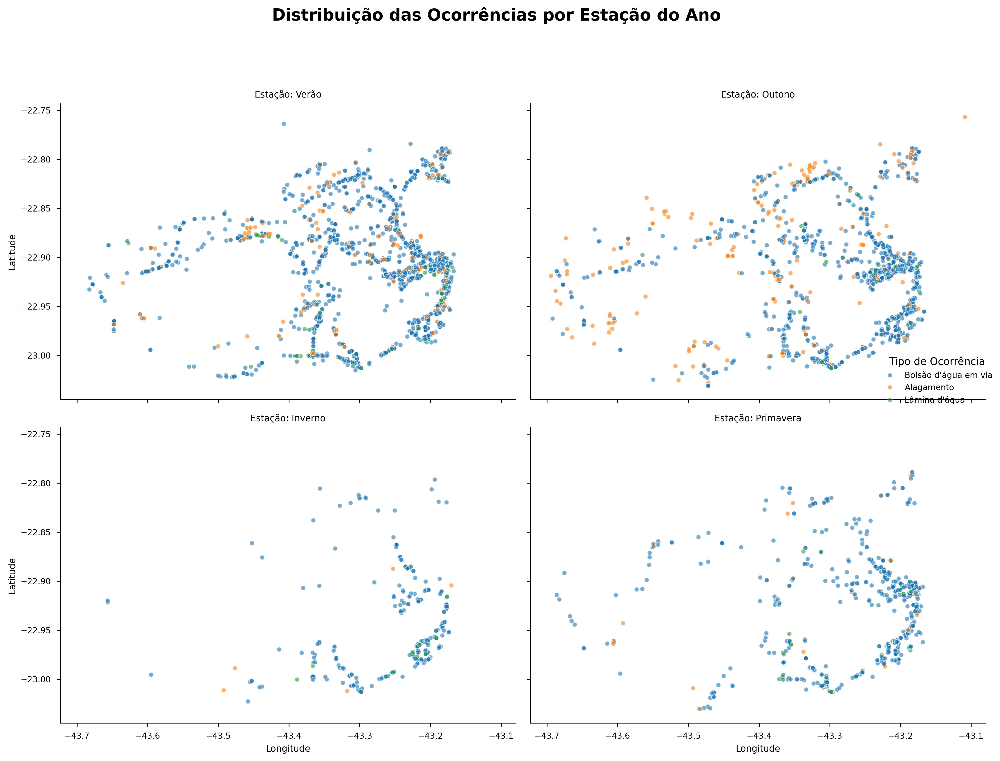

In [36]:
import geopandas as gpd
import seaborn as sns
import matplotlib.pyplot as plt

# Estilo e resolução
plt.style.use('seaborn-v0_8-paper')
plt.rcParams['figure.dpi'] = 300

# Adicionar coluna de estação em português
season_translation = {'Summer': 'Verão', 'Autumn': 'Outono', 'Winter': 'Inverno', 'Spring': 'Primavera'}
ocorrencias['estacao'] = ocorrencias['season'].map(season_translation)

# Usar seaborn.relplot para criar facetas geoespaciais por estação
g = sns.relplot(
    data=ocorrencias,
    x='longitude', y='latitude',
    hue='tipo',
    col='estacao',
    col_wrap=2, # Duas colunas
    kind='scatter',
    s=20,
    alpha=0.6,
    edgecolor='w',
    linewidth=0.5,
    height=5,
    aspect=1.2,
    col_order=['Verão', 'Outono', 'Inverno', 'Primavera']
)

# Estilização
g.fig.suptitle('Distribuição das Ocorrências por Estação do Ano', y=1.03, fontsize=16, weight='bold')
g.set_axis_labels('Longitude', 'Latitude')
g.set_titles("Estação: {col_name}")
g.legend.set_title('Tipo de Ocorrência')

# Adicionar um mapa base a cada faceta (requer iteração)
# Nota: Esta parte é mais avançada e pode tornar o plot lento.
# for ax in g.axes.flatten():
#     ctx.add_basemap(ax, crs='EPSG:4326', source=ctx.providers.CartoDB.Positron)

plt.tight_layout(rect=[0, 0, 1, 0.97])
plt.show()

### Bubble Maps

- Plot events with bubble sizes representing duration, overlaid on time or maps.

#### Bubble Map with Plotly

C:\Users\Hanna\AppData\Local\Temp\ipykernel_16032\2485017831.py:35: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap = cm.get_cmap('tab10', len(event_types))


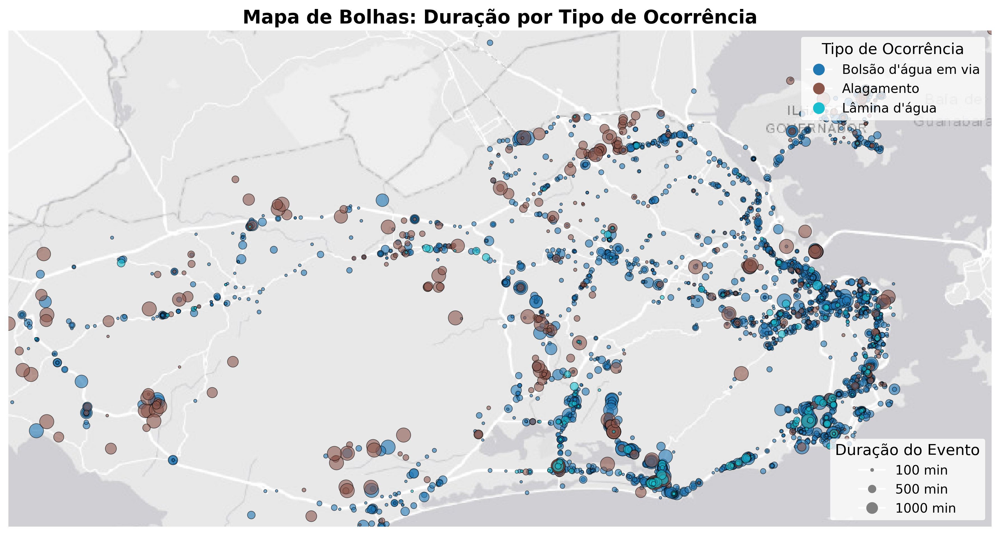

In [37]:
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
import cartopy.io.img_tiles as cimgt
import geopandas as gpd
import matplotlib.cm as cm
import numpy as np

# Estilo e resolução
plt.style.use('seaborn-v0_8-paper')
plt.rcParams['figure.dpi'] = 300

# Classe de tiles
class CustomTiles(cimgt.OSM):
    def __init__(self, url, attribution=None):
        super().__init__()
        self._url_template = url
        self.attribution = attribution or "Atribuição de dados não definida"
    def _image_url(self, tile):
        x, y, z = tile
        return self._url_template.format(z=z, x=x, y=y, s='a')

map_proj = ccrs.Mercator()

# Preparar dados
gdf_events = gpd.GeoDataFrame(ocorrencias, geometry=gpd.points_from_xy(ocorrencias.longitude, ocorrencias.latitude), crs="EPSG:4326").to_crs(map_proj.proj4_init)

# --- Plotagem ---
fig, ax = plt.subplots(figsize=(12, 12), subplot_kw={"projection": map_proj})
tiler = CustomTiles("https://server.arcgisonline.com/arcgis/rest/services/Canvas/World_Light_Gray_Base/MapServer/tile/{z}/{y}/{x}")
ax.add_image(tiler, 11)
ax.set_extent(gdf_events.total_bounds[[0, 2, 1, 3]], crs=map_proj)

# Cores e tamanhos
event_types = gdf_events['tipo'].unique()
cmap = cm.get_cmap('tab10', len(event_types))
color_map = {tipo: cmap(i) for i, tipo in enumerate(event_types)}

# Normalizar tamanho das bolhas
duration = gdf_events['duration_minutes'].clip(upper=1500) # Limitar outliers
sizes = (duration / 10).clip(lower=5) # Escala para tamanho visual

# Plotar
for tipo in event_types:
    subset = gdf_events[gdf_events['tipo'] == tipo]
    subset_sizes = sizes[subset.index]
    ax.scatter(subset.geometry.x, subset.geometry.y, s=subset_sizes,
               color=color_map[tipo], alpha=0.6, edgecolor='black', linewidth=0.5, label=tipo)

# --- Legenda customizada (para tipos e tamanhos) ---
# Legenda para os tipos (cores)
from matplotlib.lines import Line2D
legend_elements_color = [Line2D([0], [0], marker='o', color='w', label=tipo,
                                markerfacecolor=color_map[tipo], markersize=10) for tipo in event_types]

# Legenda para os tamanhos
size_values = [100, 500, 1000] # Duração em minutos
scaled_sizes = (np.array(size_values) / 10)
legend_elements_size = [Line2D([0], [0], marker='o', color='w', label=f'{val} min',
                               markerfacecolor='gray', markersize=np.sqrt(s)) for val, s in zip(size_values, scaled_sizes)]

# Criar a primeira legenda para os tipos
leg1 = ax.legend(handles=legend_elements_color, title="Tipo de Ocorrência", loc='upper right', fontsize=11, title_fontsize=13)
ax.add_artist(leg1) # Adicionar a primeira legenda para que a segunda não a substitua

# Criar a segunda legenda para os tamanhos
ax.legend(handles=legend_elements_size, title="Duração do Evento", loc='lower right', fontsize=11, title_fontsize=13)

ax.set_title("Mapa de Bolhas: Duração por Tipo de Ocorrência", fontsize=16, weight='bold')
ax.set_axis_off()
plt.tight_layout()
plt.show()

#### Bubble Map with Cartopy, Geopandas and Matplotlib

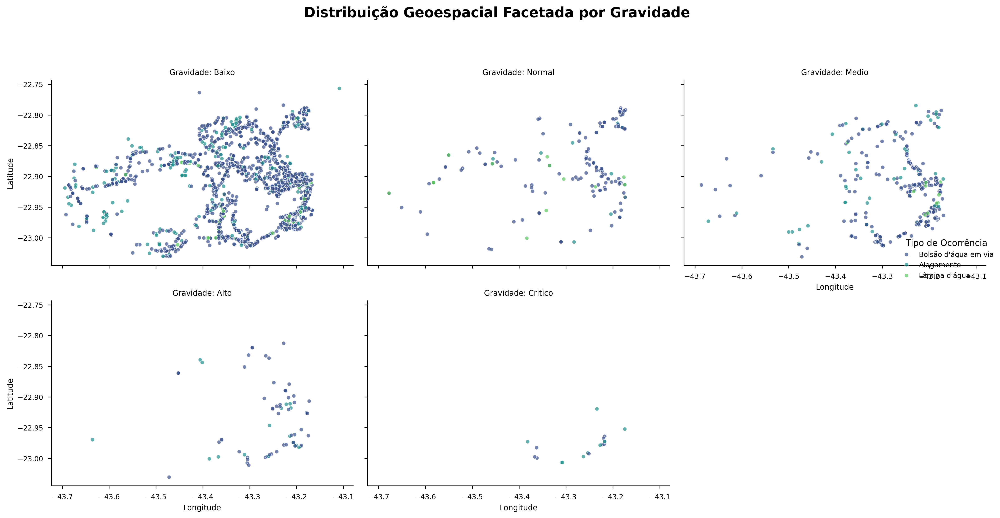

In [38]:
import seaborn as sns
import matplotlib.pyplot as plt

# Estilo e resolução
plt.style.use('seaborn-v0_8-paper')
plt.rcParams['figure.dpi'] = 300

# Limpar e ordenar categorias de gravidade para o plot
gravidade_order = ['Baixo', 'Normal', 'Medio', 'Alto', 'Critico']
ocorrencias_filtered = ocorrencias[ocorrencias['gravidade'].isin(gravidade_order)].copy()
ocorrencias_filtered['gravidade'] = pd.Categorical(ocorrencias_filtered['gravidade'], categories=gravidade_order, ordered=True)


# Criar o plot facetado com seaborn
g = sns.relplot(
    data=ocorrencias_filtered,
    x='longitude', y='latitude',
    hue='tipo',
    col='gravidade',
    col_wrap=3, # 3 colunas por linha
    kind='scatter',
    s=20,
    alpha=0.7,
    edgecolor='w',
    linewidth=0.5,
    height=4,
    aspect=1.2,
    palette='viridis'
)

# Estilização
g.fig.suptitle('Distribuição Geoespacial Facetada por Gravidade', y=1.03, fontsize=16, weight='bold')
g.set_axis_labels('Longitude', 'Latitude')
g.set_titles("Gravidade: {col_name}")
g.legend.set_title('Tipo de Ocorrência')

plt.tight_layout(rect=[0, 0, 1, 0.97])
plt.show()